<a href="https://colab.research.google.com/github/ssanudo/ProcesamDigImagTP/blob/main/TP8/PDI_TP8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Trabajo Práctico Nro 8
# **Remuestreo, Reconstrucción, Cuantización, Compresión**

# **Remuestreo**
# Downsampling:
El muestreo de una imagen tiene el efecto de reducir la resolución espacial de la misma. Puede observarse la perdida de información introducida con el aumento del paso de muestreo, así como el ruido que se va introduciendo en forma de patrones rectangulares sobre la imagen (pixelado).
# Upsampling:
A la inversa del Downsampling, permite elevar la resolución espacial de una imágen, si es X2 la duplica. Esto permite hacer zoom en una imágen y retardar la aparición del pixelado.

**Mas informacion de los diferentes métodos en:**

https://medium.com/analytics-vidhya/downsampling-and-upsampling-of-images-demystifying-the-theory-4ca7e21db24a

https://www.youtube.com/watch?v=L2soA3GdPXU
# Cuantización

Para cuantificar la intensidad de cada pixel de la imagen será necesario decidir la cantidad de niveles que deberán emplearse. Cuando la utilización de la imagen se realiza con fines artísticos será en definitiva la apreciación humana la que dirá cuántos niveles son necesarios.

Como el objetivo final del proceso de digitalización es el almacenamiento y manipulación de la información generada mediante sistemas digitales, el número de niveles de cuantificación será elegido de manera de estar expresado por un número entero de bits, ya que ésta es la unidad de información que podemos almacenar y manipular mediante tales dispositivos. Luego, elegiremos 2, 4, 8, 16, 32, 64, etc., niveles diferentes, ya que corresponden respectivamente a 1, 2, 3, 4, 5, 6, etc., bits de información.


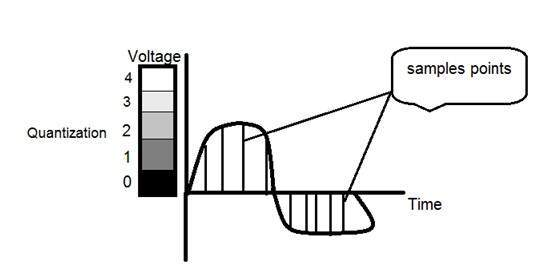

Cuantización con Dithering y con Difusión del error:

https://www.cs.princeton.edu/courses/archive/fall00/cs426/lectures/dither/dither.pdf
http://matematicas.uam.es/~fernando.chamizo/dark/d_dither.html



**TP 8:**

Implementar un aplicativo que permita abrir una imagen y con esta obtener:
* Downsampling X2 (mostrando la imagen resultado al doble de tamaño para comparar el efecto) utilizando kernel constante, bilineal, y bicúbico.
* Upsampling X2 (mostrando la imagen original al doble de tamaño para comparar el efecto) utilizando kernel constante, bilineal, y bicúbico.
* Cuantización a cantidad de niveles de gris variable, utilizando uniforme, dithering aleatorio, y difusión del error por scan-line.


Todas las funciones de Downsamplig, Upsampling y Cuantización deben ser desarrolladas como funciones propias y NO con funciones de biblioteca. Les sugiero recorrer la imagen mediante ciclos for anidados para una fácil implementación.


Fecha de entrega: 08 de Dicembre.
Saludos y nos vemos mañana!

#**Librerías**

In [ ]:
import imageio
from scipy import fftpack as fp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

import ipywidgets as widgets
from IPython.display import display


# Funciones

In [ ]:
#Funciones

def ImgShapeShow(im):#muestra datos de forma del arreglo obtenido de las imágenes
  print('Tamaño del arreglo',im.shape, 'donde', im.shape[0], 'x',im.shape[1],'es el tamaño de la imágen en píxeles, y ',im.shape[2], 'es el valor RGB de cada uno de dichos píxeles' )
  

def RGB2Y(im): #función que convierte de RGB a YIQ de una imágen
  #Normalizo valores RGB de 0-255 a 0-1
  imNorm=normalizeRGB(im.copy())
  #Obtengo valores de YIQ 
  im_YIQ=np.dot(imNorm, rgb2yiq.T)
  im_YIQ[:,:,0][im_YIQ[:,:,0]>=1]=1
  im_YIQ[:,:,0][im_YIQ[:,:,0]<0]=0
  return im_YIQ[:,:,0]
  

def open_img2lum(file_path):#Abre la imágen, y devuelve su luminancia
  im=imageio.imread(file_path)
  ImgShapeShow(im)
  if (im.shape[2]==4):im=im[:,:,0:3]
  im = im.astype(np.int)
  Yim=RGB2Y(im)
  return Yim

def open_img2lum_crudo(file_path):#Abre la imágen, y devuelve su luminancia
  im=imageio.imread(file_path)
  ImgShapeShow(im)
  if (im.shape[2]==4):im=im[:,:,0:3]
  im = im.astype(np.int)
  Yim=RGB2Y_crudo(im)
  return Yim



def open_img(file_path):#Abre la imágen, y muestra datos de forma
  im=imageio.imread(file_path)
  ImgShapeShow(im)
  if (im.shape[2]==4):im=im[:,:,0:3]
  im = im.astype(np.int)
  return im

def save_img(im,imgName): #guarda la imagen con el nombre imgName
  imgName=imgName+'.png'
  imageio.imwrite(imgName, im.astype(np.uint8))

def normalizeRGB(x):return np.array((x - 0) / (255))
#Normaliza [0-255] RGB de la imagen en el rango [0,1], x es el arreglo de RGB de la img.

def normalizeY(y,yMin,yMax):return np.array((y - yMin) / (yMax-yMin))
#Normaliza y, lo estira, a [0,1], y es el arreglo de Luminancia de la img.


#Defino las matrices de conversión, de RGB a YIQ y viseversa.
rgb2yiq=np.array([[0.299,0.587,0.114],[0.595716,-0.274453,-0.321263],[0.211456,-0.522591,0.311135]])
#print(rgb2yiq)
yiq2rgb=np.array([[1,0.9663,0.621],[1,-0.2721,-0.6474],[1,-1.1070,1.7046]])
#print(yiq2rgb)


def RGB2YIQ(im): #función que convierte de RGB a YIQ de una imágen
  #Normalizo valores RGB de 0-255 a 0-1
  imNorm=normalizeRGB(im.copy())
  #Obtengo valores de YIQ 
  im_YIQ=np.dot(imNorm, rgb2yiq.T)
  im_YIQ[:,:,0][im_YIQ[:,:,0]>=1]=1
  im_YIQ[:,:,0][im_YIQ[:,:,0]<0]=0
  im_YIQ[:,:,1][im_YIQ[:,:,1]<-0.5957]=-0.5957
  im_YIQ[:,:,1][im_YIQ[:,:,1]>0.5957]=0.5957
  im_YIQ[:,:,2][im_YIQ[:,:,2]<-0.5226]=-0.5226
  im_YIQ[:,:,2][im_YIQ[:,:,2]>0.5226]=0.5226
  #Vuelvo a RGB normalizado
  YIQcFin=np.dot(im_YIQ, yiq2rgb.T)
  #Desnormalizo
  YIQcFin=YIQcFin*255
  ImC=YIQcFin.astype(np.int)
  return im_YIQ

def YIQ2RGB(im_YIQ):
  #Vuelvo a RGB normalizado
  RGBFin=np.dot(im_YIQ, yiq2rgb.T)
  #Desnormalizo
  RGBFin=RGBFin*255
  ImC=RGBFin.astype(np.int)
  return ImC

def RGB2Y(im): #función que convierte de RGB a YIQ de una imágen
  #Normalizo valores RGB de 0-255 a 0-1
  imNorm=normalizeRGB(im.copy())
  #Obtengo valores de YIQ 
  im_YIQ=np.dot(imNorm, rgb2yiq.T)
  im_YIQ[:,:,0][im_YIQ[:,:,0]>=1]=1
  im_YIQ[:,:,0][im_YIQ[:,:,0]<0]=0
  #Vuelvo a RGB normalizado
  YIQcFin=np.dot(im_YIQ, yiq2rgb.T)
  #Desnormalizo
  YIQcFin=YIQcFin*255
  ImC=YIQcFin.astype(np.int)
  return ImC
  #return im_YIQ[:,:,0]

def RGB2Y_01(im,thresh): #función que convierte de RGB a YIQ de una imágen, binarizada 0 y 1
  #Normalizo valores RGB de 0-255 a 0-1
  imNorm=normalizeRGB(im.copy())
  #Obtengo valores de YIQ 
  im_YIQ=np.dot(imNorm, rgb2yiq.T)
  im_YIQ[:,:,0][im_YIQ[:,:,0]>=1]=1
  im_YIQ[:,:,0][im_YIQ[:,:,0]<0]=0
  im_YIQ[:,:,0][im_YIQ[:,:,0]>=thresh]=1
  im_YIQ[:,:,0][im_YIQ[:,:,0]<thresh]=0
  #Vuelvo a RGB normalizado
  
  return im_YIQ[:,:,0]

def RGB2Y_crudo(im): #función que convierte de RGB a YIQ de una imágen
  #Normalizo valores RGB de 0-255 a 0-1
  imNorm=normalizeRGB(im.copy())
  #Obtengo valores de YIQ 
  im_YIQ=np.dot(imNorm, rgb2yiq.T)
  im_YIQ[:,:,0][im_YIQ[:,:,0]>=1]=1
  im_YIQ[:,:,0][im_YIQ[:,:,0]<0]=0
  return im_YIQ[:,:,0]
  

def LoadScaleImg(path): #Cargo y escalo img
  #escalo RGB a 0-1
  im = np.clip(imageio.imread(path)/255.,0.,1.)
  return im




#==============================================================================
#==============================================================================
def ImgDownSamp(Yimg):
     #Downsampling Constante, guarda saltando un pixel
    Yimg=Yimg[:,:,0]
    row = Yimg.shape[0]-1
    col = Yimg.shape[1]-1
    #print('row= ',row,'col= ',col)
    ImDownS= np.zeros((Yimg.shape[0]//2, Yimg.shape[1]//2), dtype=np.int)
    #print('nueva img dim',ImDownS.shape)
    #print('Yimg.shape[0]',Yimg.shape)
    for i in range(row):
        for j in range(col):                 
            ImDownS[int(i/2),int(j/2)] =Yimg[i,j]        
    return ImDownS

def ImgDownSampMean(Yimg):
     #Downsampling Bilineal X2, guarda la media de los píxels adyascentes
    Yimg=Yimg[:,:,0]
    row = Yimg.shape[0]-1
    col = Yimg.shape[1]-1
    #print('row= ',row,'col= ',col)
    ImDownS= np.zeros((Yimg.shape[0]//2, Yimg.shape[1]//2), dtype=np.int)
    #print('nueva img dim',ImDownS.shape)
    #print('Yimg.shape[0]',Yimg.shape)
    for i in range(row):
        for j in range(col):                 
            ImDownS[int(i/2),int(j/2)] =(Yimg[i,j]+Yimg[i,j+1]+Yimg[i+1,j]+Yimg[i+1,j+1])/4       
    return ImDownS


def ImgDownSampBicub(Yimg):
     #Downsampling Bicúbico, guarda [-1/8, 5/8, 5/8, -1/8] por el vector de luminancia de los 4 píxels adyascentes adyascentes
    Yimg=Yimg[:,:,0]
    row = Yimg.shape[0]-1
    col = Yimg.shape[1]-1
    #print('row= ',row,'col= ',col)
    ImDownS= np.zeros((Yimg.shape[0]//2, Yimg.shape[1]//2), dtype=np.int)
    #print('nueva img dim',ImDownS.shape)
    #print('Yimg.shape[0]',Yimg.shape)
    for i in range(row):
        for j in range(col-2):                 
            ImDownS[int(i/2),int(j/2)] =-(1/8)*Yimg[i,j]+(5/8)*Yimg[i,j+1]+(5/8)*Yimg[i,j+2]-(1/8)*Yimg[i,j+3]
    return ImDownS


def ImgUpSamp(Yimg):
    # Up sampling Constante, copia el pixel en 4 lugares
    Yimg=Yimg[:,:,0]
    row = Yimg.shape[0]*2-1
    col = Yimg.shape[1]*2-1
    #print('row= ',row,'col= ',col)
    ImUpS= np.zeros((Yimg.shape[0]*2, Yimg.shape[1]*2), dtype=np.int)
    #print('nueva img dim',ImDownS.shape)
    #print('Yimg.shape[0]',Yimg.shape)
    for i in range(row):
        for j in range(col):                 
            ImUpS[i,j] =Yimg[i//2,j//2]
            ImUpS[i+1,j] =Yimg[i//2,j//2]
            ImUpS[i+1,j+1] =Yimg[i//2,j//2]
            ImUpS[i,j+1] =Yimg[i//2,j//2]
    return ImUpS

   
def ImgUpSampBil(Yimg):
    # Up sampling Bilineal, agrega promedio de píxeles adyascentes
    Yimg=Yimg[:,:,0]
    row = Yimg.shape[0]*2-2
    col = Yimg.shape[1]*2-2
    #print('row= ',row,'col= ',col)
    ImUpS= np.zeros((Yimg.shape[0]*2, Yimg.shape[1]*2), dtype=np.int)
    #print('nueva img dim',ImDownS.shape)
    #print('Yimg.shape[0]',Yimg.shape)
    for i in range(row):
        for j in range(col):                 
            ImUpS[i,j] =Yimg[i//2,j//2]
            ImUpS[i+1,j] =(Yimg[i//2,j//2]+Yimg[(i//2)+1,j//2])/2
            ImUpS[i+1,j+1] =(Yimg[i//2,j//2]+Yimg[(i//2)+1,j//2]+Yimg[i//2,j//2]+Yimg[i//2,(j//2)+1])/4
            ImUpS[i,j+1] =(Yimg[i//2,j//2]+Yimg[i//2,(j//2)+1])/2
    return ImUpS

def ImgUpSampBicub(Yimg):
    # Up sampling Bicúbica, genera nuevo pixel con aritmética de sus 4 vecinos
    Yimg=Yimg[:,:,0]
    row = Yimg.shape[0]*2-6
    col = Yimg.shape[1]*2-6
    #print('row= ',row,'col= ',col)
    ImUpS= np.zeros((Yimg.shape[0]*2, Yimg.shape[1]*2), dtype=np.int)
    ImUpS[0:1,0:1] =Yimg[0:1,0:1]
    for i in range(row):
        for j in range(col):    
            ImUpS[i+2,j] =-(1/8)*Yimg[i//2,j//2]+(5/8)*Yimg[(i//2)+1,j//2]+(5/8)*Yimg[(i//2)+2,(j//2)]-(1/8)*Yimg[(i//2)+3,(j//2)]
            ImUpS[i,j+2] =-(1/8)*Yimg[i//2,j//2]+(5/8)*Yimg[(i//2),(j//2)+1]+(5/8)*Yimg[(i//2),(j//2)+2]-(1/8)*Yimg[(i//2),(j//2)+3]
    return ImUpS




def CuantizaNiveles_01(lum,N):
  nivel= np.zeros(N)
  nivel[0]=0
  for i in range(1,N):
    nivel[i]=i/(N-1)
  for i in range(N-1):
    if (lum>=nivel[i])&(lum<nivel[i+1]):
      lum=nivel[i]
  return lum


def CuantizaNiveles(lum,N):
  nivel= np.zeros(N)
  nivel[0]=0
  lum=lum/255
  for i in range(1,N):
    nivel[i]=i/(N-1)
  for i in range(N-1):
    if (lum>=nivel[i])&(lum<nivel[i+1]):
      lum=nivel[i]
  lum=lum*255
  lum.astype(np.int)
  return lum
    
def ImgCuantizacion(Yimg,n):

    # Cuantización de niveles de gris
    Yimg=Yimg[:,:,0]
    row = Yimg.shape[0]
    col = Yimg.shape[1]
    ImUpS= np.zeros((Yimg.shape[0], Yimg.shape[1]), dtype=np.float)
    for i in range(row):       
        for j in range(col):    
            #ImUpS[i,j] =(Yimg[i,j]*(n-1)+np.random.rand()-0.5)/(n-1)
            ImUpS[i,j] =CuantizaNiveles(Yimg[i,j],n)
            #error=error+ImUpS[i,j]-Yimg[i,j]
        #errorFila[i]=error

    return ImUpS

def ImgCuantizacionDithering(Yimg,n):

    #Dithering sin cuantizar niveles
    Yimg=Yimg[:,:,0]
    row = Yimg.shape[0]
    col = Yimg.shape[1]
    ImUpS= np.zeros((Yimg.shape[0], Yimg.shape[1]), dtype=np.float)
    for i in range(row):       
        for j in range(col):    
            ImUpS[i,j] =(((Yimg[i,j])*(n-1))+((np.random.rand()+0.5)*255))/(n-1)
            ImUpS[i,j].astype(np.int)
            #error=error+ImUpS[i,j]-Yimg[i,j]
        #errorFila[i]=error

    return ImUpS

def ImgCuantizacionDithering2(Yimg,n):

    #'Cuantización con Dithering
    Yimg=Yimg[:,:,0]
    row = Yimg.shape[0]
    col = Yimg.shape[1]
    ImUpS= np.zeros((Yimg.shape[0], Yimg.shape[1]), dtype=np.float)
    for i in range(row):       
        for j in range(col):    
            ImUpS[i,j] =(((Yimg[i,j])*(n-1))+((np.random.rand()-0.5)*255))/(n-1)
            ImUpS[i,j] =CuantizaNiveles(ImUpS[i,j],n)
            #ImUpS[i,j].astype(np.int)
            #error=error+ImUpS[i,j]-Yimg[i,j]
        #errorFila[i]=error

    return ImUpS

def ImgCuantizacionDifError2(Yimg,n):

    # 'Cuantización con Dif. Error de 0.5 (ordenado) en Alg. Floyd-Steinberg'
    Yimg=Yimg[:,:,0]
    row = Yimg.shape[0]-1
    col = Yimg.shape[1]-1
    ImUpS= np.zeros((Yimg.shape[0], Yimg.shape[1]), dtype=np.float)
    for i in range(row):       
        for j in range(1,col):    
            ImUpS[i,j] =((Yimg[i,j])+(0.5*255))
            if(ImUpS[i,j] >255):ImUpS[i,j]=255
            ImUpS[i,j] =CuantizaNiveles(ImUpS[i,j],n)
            error=Yimg[i,j]-ImUpS[i,j]
            Yimg[i,j+1] =Yimg[i,j+1]+(7/16)*error
            Yimg[i+1,j-1] =Yimg[i+1,j-1]+(3/16)*error
            Yimg[i+1,j] =Yimg[i+1,j]+(5/16)*error
            Yimg[i+1,j+1] =Yimg[i+1,j+1]+(1/16)*error
            

        #errorFila[i]=error
        #print('error fila',error,'salida',ImUpS[i,:],'entrada',Yimg[i,:])
    return ImUpS



def ImgCuantizacionDifError(Yimg,n):
    # 'Cuantización con Dif. Error de Dithering en Alg. Floyd-Steinberg'
    Yimg=Yimg[:,:,0]
    row = Yimg.shape[0]-1
    col = Yimg.shape[1]-1
    ImUpS= np.zeros((Yimg.shape[0], Yimg.shape[1]), dtype=np.float)
    for i in range(row):       
        for j in range(1,col):    
            ImUpS[i,j] =(((Yimg[i,j])*(n-1))+((np.random.rand()-0.5)*255))/(n-1)
            if(ImUpS[i,j] >255):ImUpS[i,j]=255
            ImUpS[i,j] =CuantizaNiveles(ImUpS[i,j],n)
            ImUpS[i,j].astype(np.int)
            error=Yimg[i,j]-ImUpS[i,j]
            Yimg[i,j+1] =Yimg[i,j+1]+(7/16)*error
            Yimg[i+1,j-1] =Yimg[i+1,j-1]+(3/16)*error
            Yimg[i+1,j] =Yimg[i+1,j]+(5/16)*error
            Yimg[i+1,j+1] =Yimg[i+1,j+1]+(1/16)*error
        #errorFila[i]=error
        #print('error fila',error,'salida',ImUpS[i,:],'entrada',Yimg[i,:])
    return ImUpS

def ImgCuantizacionDifError3(Yimg,n):
    # 'Cuantización con Dif. Error de Cuantización en Alg. Floyd-Steinberg'
    Yimg=Yimg[:,:,0]
    row = Yimg.shape[0]-1
    col = Yimg.shape[1]-1
    ImUpS= np.zeros((Yimg.shape[0], Yimg.shape[1]), dtype=np.float)
    for i in range(row):       
        for j in range(1,col):    
            ImUpS[i,j] =CuantizaNiveles(Yimg[i,j],n)
            error=Yimg[i,j]-ImUpS[i,j]
            Yimg[i,j+1] =Yimg[i,j+1]+(7/16)*error
            Yimg[i+1,j-1] =Yimg[i+1,j-1]+(3/16)*error
            Yimg[i+1,j] =Yimg[i+1,j]+(5/16)*error
            Yimg[i+1,j+1] =Yimg[i+1,j+1]+(1/16)*error
        #errorFila[i]=error
        #print('error fila',error,'salida',ImUpS[i,:],'entrada',Yimg[i,:])
    return ImUpS


def DoRemuestreo(OpRem, Img,Niveles): #Fcn que permite llevar a cabo las operaciones entre imágenes requeridas en la interfaz

  if (OpRem=='DownSampling Constante'):
    FilteredImg=ImgDownSamp(Img)
  elif (OpRem=='DownSampling Bilineal'):
    FilteredImg=ImgDownSampMean(Img)
  elif (OpRem=='DownSampling Bicúbico'):
    FilteredImg=ImgDownSampBicub(Img)
  elif (OpRem=='Upsampling Constante'):
    FilteredImg=ImgUpSamp(Img)
  elif (OpRem=='Upsampling Bilineal'):
    FilteredImg=ImgUpSampBil(Img)
  elif (OpRem=='Upsampling Bicubico'):
    FilteredImg=ImgUpSampBicub(Img)
  elif (OpRem=='Cuantización'):
    n=Niveles
    FilteredImg=ImgCuantizacion(Img,n)
  elif (OpRem=='Cuantización con Dithering'):
    n=Niveles
    FilteredImg=ImgCuantizacionDithering2(Img,n)
  elif (OpRem=='Cuantización con Difusión del Error'):
    n=Niveles
    FilteredImg=ImgCuantizacionDifError3(Img,n)
  elif (OpRem=='Cuantización con Dif. Error Floyd-Steinberg'):
    n=Niveles
    FilteredImg=ImgCuantizacionDifError(Img,n)
  else:
     print('No es un valor válido')
  return FilteredImg

#Primer parte: Subir imágen

Tamaño del arreglo (768, 623, 3) donde 768 x 623 es el tamaño de la imágen en píxeles, y  3 es el valor RGB de cada uno de dichos píxeles
Tamaño del arreglo (768, 623, 3) donde 768 x 623 es el tamaño de la imágen en píxeles, y  3 es el valor RGB de cada uno de dichos píxeles


Text(0.5, 1.0, 'Imágen Luminancias')

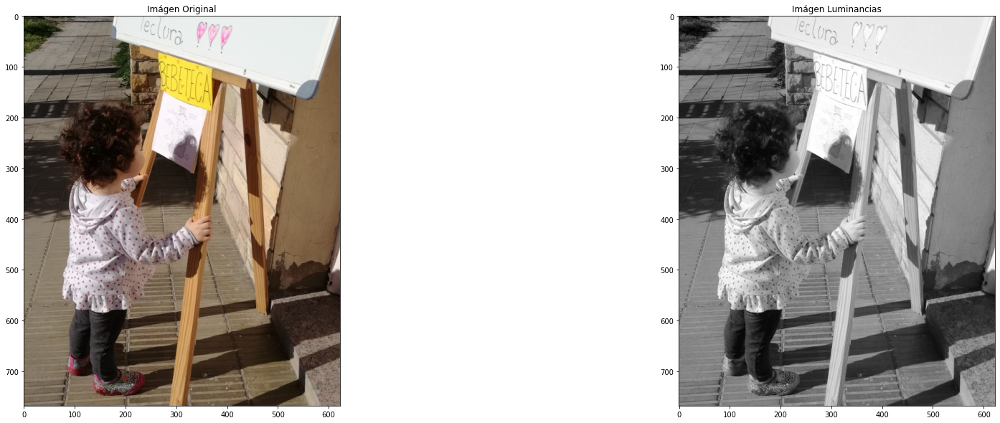

In [ ]:
#@title ## Seleccione una imágen, trabajaremos con su Luminancia (Y).
#@markdown Puede utilizar una imágen propia, una previamente procesada o la mía: 
#@markdown ---
#@markdown ### Enter an Image path:
file_path ='/content/PrIm1.png'#'/content/pic1.png'
# #@param {type:"string"}
#@markdown ---
Yim=open_img2lum(file_path)
Yim2=Yim
#Abro la img en PNG como un arreglo
#im =open_img(file_path)
im2=open_img(file_path)
plt.figure(figsize=(30, 10))
plt.subplot(1,2,1)
plt.imshow(im2,'gray')
plt.title('Imágen Original')
plt.subplot(1,2,2)
plt.imshow(Yim[:,:,0],'gray')
plt.title('Imágen Luminancias')



In [ ]:
Yim

#Segunda parte: Remuestreo,cuantización

Tamaño del arreglo (768, 623, 3) donde 768 x 623 es el tamaño de la imágen en píxeles, y  3 es el valor RGB de cada uno de dichos píxeles


Text(0.5, 1.0, 'Cuantización con Difusión del Error')

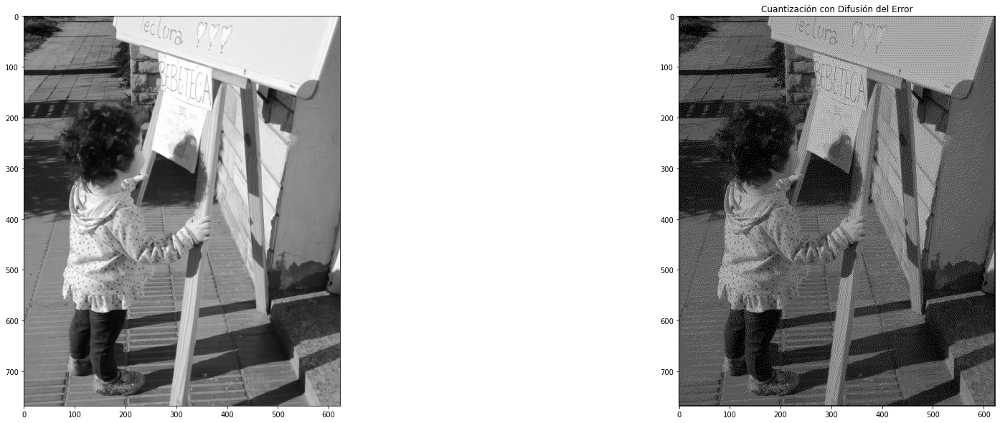

In [ ]:
#@title ## Operaciones de Remuestreo,cuantización
#@markdown  Seleccione operación:

Operacion = 'Cuantización con Difusión del Error' #@param ["'Cuantización'","'Cuantización con Dithering'","'Cuantización Dithering con Difusión del Error'","'Cuantización con Dif. Error Floyd-Steinberg'","'Cuantización con Difusión del Error'","'DownSampling Constante'","'DownSampling Bilineal'" , "'DownSampling Bicúbico'","'Upsampling Constante'","'Upsampling Bilineal'", "'Upsampling Bicubico'","'Cuantización'"] {type:"raw"}

#@markdown  En caso de Cuantización, seleccione el número de niveles de gris:

Niveles = 3 #@param {type:"slider", min:2, max:30, step:1}
Yim=open_img2lum(file_path)
plt.figure(figsize=(30, 10))
plt.subplot(1,2,1)
plt.imshow(Yim[:,:,0],'gray')

OpImg=DoRemuestreo(Operacion,Yim,Niveles)

if(Operacion == 'Cuantización'):
  print('Cuantiza la imágen en ',Niveles,' niveles de gris.')
  

plt.subplot(1,2,2)
plt.imshow(OpImg,'gray')
plt.title(Operacion)

Tamaño de Im. Original=  (383, 569)
Tamaño de Im. Downsampleada=  (191, 284)
Tamaño de Im. Original=  (383, 569)
Tamaño de Im. Downsampleada=  (191, 284)


Text(0.5, 1.0, 'Imágen DownSampleada Bicúbica')

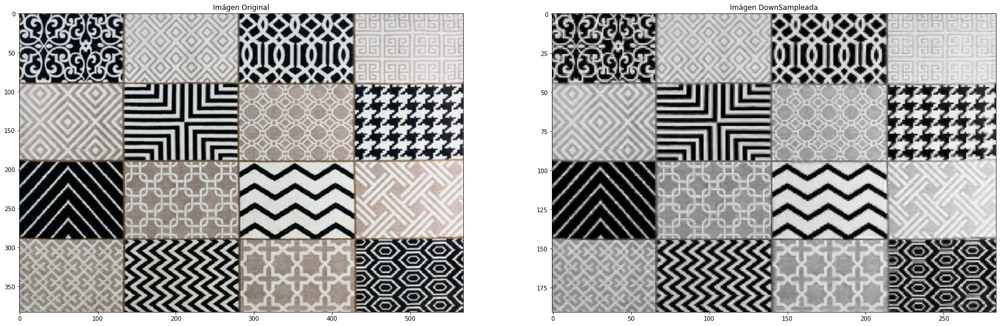

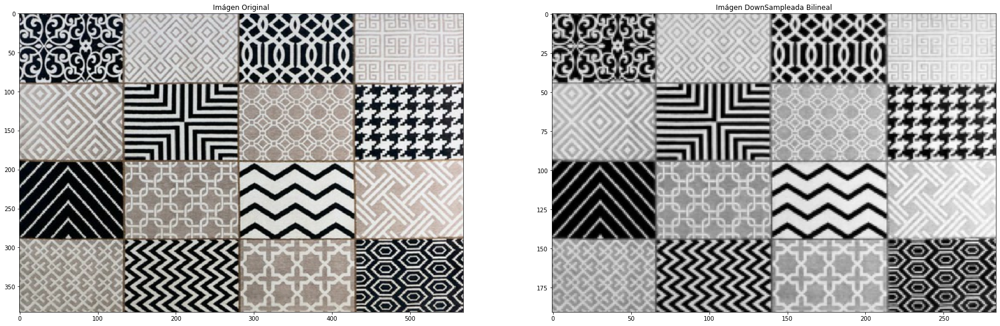

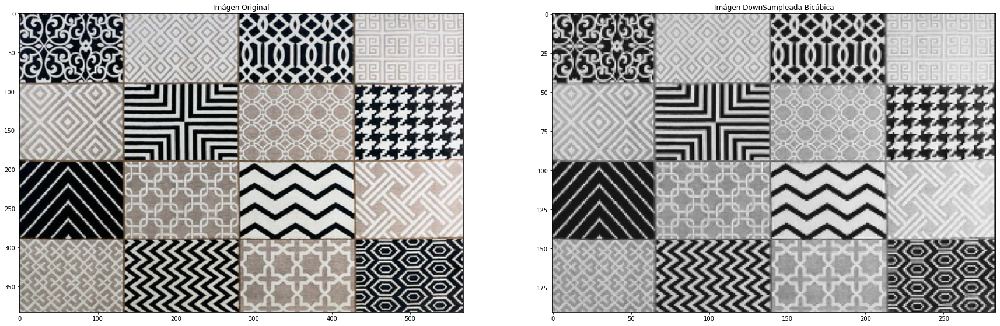

In [ ]:
imDS=ImgDownSamp(Yim)
print('Tamaño de Im. Original= ',Yim.shape[0:2])
print('Tamaño de Im. Downsampleada= ',imDS.shape)
plt.figure(figsize=(30, 10))
plt.subplot(1,2,1)
plt.imshow(im2,'gray')
plt.title('Imágen Original')
plt.subplot(1,2,2)
plt.imshow(imDS,'gray')
plt.title('Imágen DownSampleada')

imDSM=ImgDownSampMean(Yim)
print('Tamaño de Im. Original= ',Yim.shape[0:2])
print('Tamaño de Im. Downsampleada= ',imDSM.shape)
plt.figure(figsize=(30, 10))
plt.subplot(1,2,1)
plt.imshow(im2,'gray')
plt.title('Imágen Original')
plt.subplot(1,2,2)
plt.imshow(imDSM,'gray')
plt.title('Imágen DownSampleada Bilineal')


imDSB=ImgDownSampBicub(Yim)
plt.figure(figsize=(30, 10))
plt.subplot(1,2,1)
plt.imshow(im2,'gray')
plt.title('Imágen Original')
plt.subplot(1,2,2)
plt.imshow(imDSB,'gray')
plt.title('Imágen DownSampleada Bicúbica')

Text(0.5, 1.0, 'Imágen UpSampleada Bicúbica')

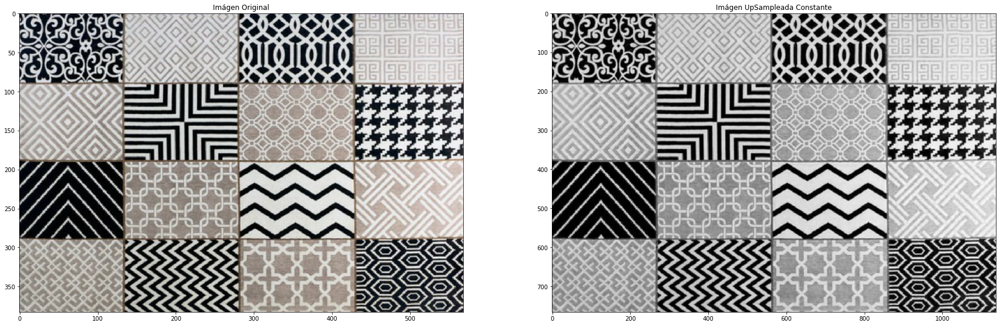

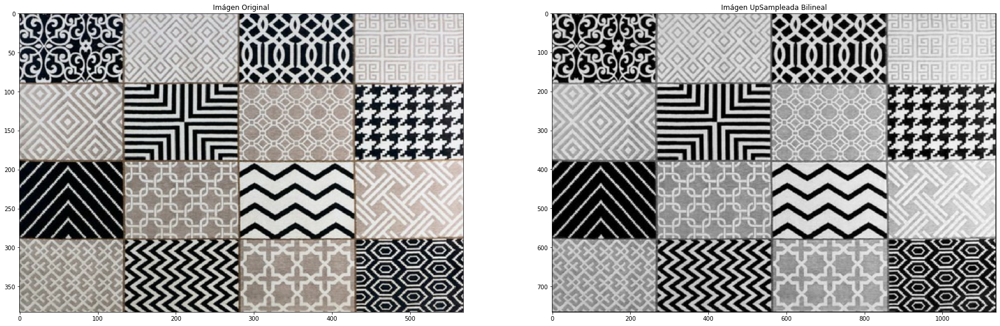

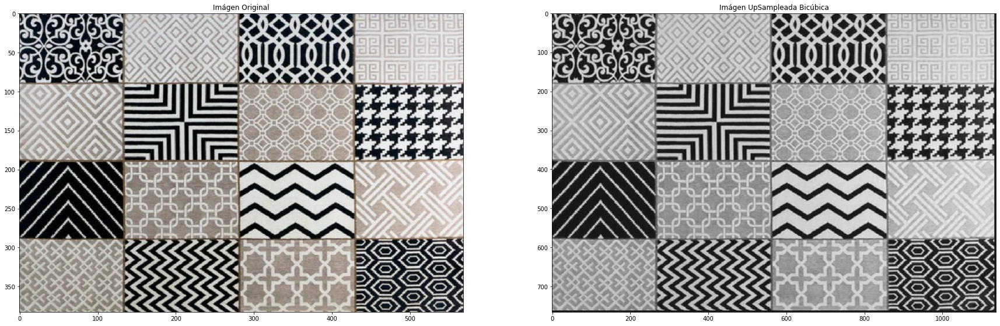

In [ ]:
imUS=ImgUpSamp(Yim)
plt.figure(figsize=(30, 10))
plt.subplot(1,2,1)
plt.imshow(im2,'gray')
plt.title('Imágen Original')
plt.subplot(1,2,2)
plt.imshow(imUS,'gray')
plt.title('Imágen UpSampleada Constante')

imUSB=ImgUpSampBil(Yim)
plt.figure(figsize=(30, 10))
plt.subplot(1,2,1)
plt.imshow(im2,'gray')
plt.title('Imágen Original')
plt.subplot(1,2,2)
plt.imshow(imUSB,'gray')
plt.title('Imágen UpSampleada Bilineal')


imUSBic=ImgUpSampBicub(Yim)
plt.figure(figsize=(30, 10))
plt.subplot(1,2,1)
plt.imshow(im2,'gray')
plt.title('Imágen Original')
plt.subplot(1,2,2)
plt.imshow(imUSBic,'gray')
plt.title('Imágen UpSampleada Bicúbica')

Tamaño del arreglo (768, 623, 3) donde 768 x 623 es el tamaño de la imágen en píxeles, y  3 es el valor RGB de cada uno de dichos píxeles
Tamaño del arreglo (768, 623, 3) donde 768 x 623 es el tamaño de la imágen en píxeles, y  3 es el valor RGB de cada uno de dichos píxeles
Tamaño del arreglo (768, 623, 3) donde 768 x 623 es el tamaño de la imágen en píxeles, y  3 es el valor RGB de cada uno de dichos píxeles
Tamaño del arreglo (768, 623, 3) donde 768 x 623 es el tamaño de la imágen en píxeles, y  3 es el valor RGB de cada uno de dichos píxeles
Tamaño del arreglo (768, 623, 3) donde 768 x 623 es el tamaño de la imágen en píxeles, y  3 es el valor RGB de cada uno de dichos píxeles
Tamaño del arreglo (768, 623, 3) donde 768 x 623 es el tamaño de la imágen en píxeles, y  3 es el valor RGB de cada uno de dichos píxeles


Text(0.5, 1.0, 'Imágen Cuantizada  Dif.Error 0.5 en Alg FS a 8 niveles')

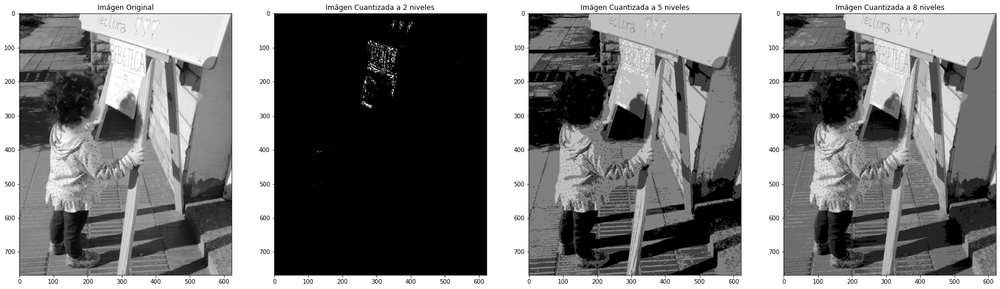

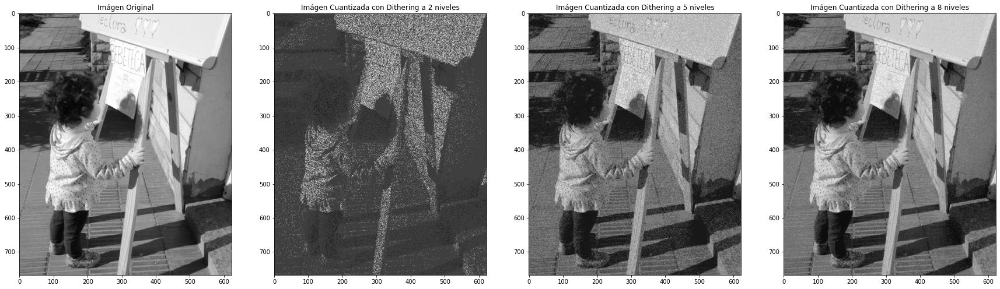

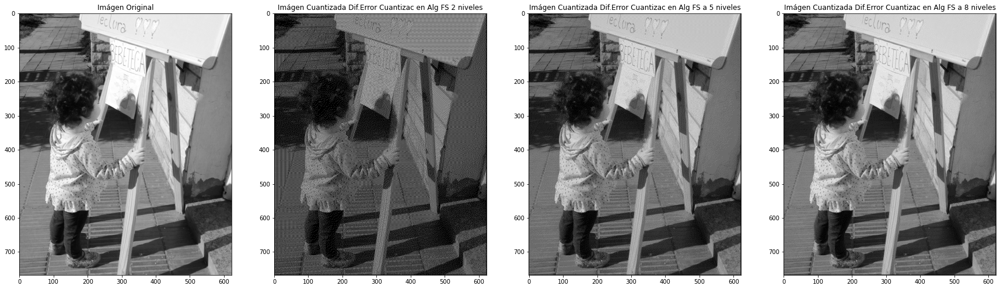

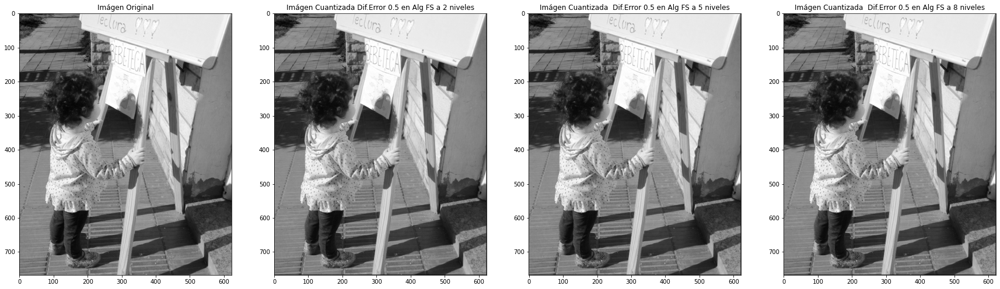

In [ ]:

imUSC2=ImgCuantizacion(Yim,2)
imUSC5=ImgCuantizacion(Yim,5)
imUSC8=ImgCuantizacion(Yim,8)
plt.figure(figsize=(30, 10))
plt.subplot(1,4,1)
plt.imshow(Yim[:,:,0],'gray')
plt.title('Imágen Original')
plt.subplot(1,4,2)
plt.imshow(imUSC2,'gray')
plt.title('Imágen Cuantizada a 2 niveles')
plt.subplot(1,4,3)
plt.imshow(imUSC5,'gray')
plt.title('Imágen Cuantizada a 5 niveles')
plt.subplot(1,4,4)
plt.imshow(imUSC8,'gray')
plt.title('Imágen Cuantizada a 8 niveles')

imUSD2=ImgCuantizacionDithering2(Yim,2)
imUSD5=ImgCuantizacionDithering2(Yim,5)
imUSD8=ImgCuantizacionDithering2(Yim,8)
plt.figure(figsize=(30, 10))
plt.subplot(1,4,1)
plt.imshow(Yim[:,:,0],'gray')
plt.title('Imágen Original')
plt.subplot(1,4,2)
plt.imshow(imUSD2,'gray')
plt.title('Imágen Cuantizada con Dithering a 2 niveles')
plt.subplot(1,4,3)
plt.imshow(imUSD5,'gray')
plt.title('Imágen Cuantizada con Dithering a 5 niveles')
plt.subplot(1,4,4)
plt.imshow(imUSD8,'gray')
plt.title('Imágen Cuantizada con Dithering a 8 niveles')


imUSC2=ImgCuantizacionDifError3(Yim,2)
Yim=open_img2lum(file_path)
imUSC5=ImgCuantizacionDifError3(Yim,5)
Yim=open_img2lum(file_path)
imUSC8=ImgCuantizacionDifError3(Yim,8)
Yim=open_img2lum(file_path)
plt.figure(figsize=(30, 10))
plt.subplot(1,4,1)
plt.imshow(Yim[:,:,0],'gray')
plt.title('Imágen Original')
plt.subplot(1,4,2)
plt.imshow(imUSC2,'gray')
plt.title('Imágen Cuantizada Dif.Error Cuantizac en Alg FS 2 niveles')
plt.subplot(1,4,3)
plt.imshow(imUSC5,'gray')
plt.title('Imágen Cuantizada Dif.Error Cuantizac en Alg FS a 5 niveles')
plt.subplot(1,4,4)
plt.imshow(imUSC8,'gray')
plt.title('Imágen Cuantizada Dif.Error Cuantizac en Alg FS a 8 niveles')

imUSD2=ImgCuantizacionDifError2(Yim,2)
Yim=open_img2lum(file_path)
imUSD5=ImgCuantizacionDifError2(Yim,5)
Yim=open_img2lum(file_path)
imUSD8=ImgCuantizacionDifError2(Yim,8)
Yim=open_img2lum(file_path)
plt.figure(figsize=(30, 10))
plt.subplot(1,4,1)
plt.imshow(Yim[:,:,0],'gray')
plt.title('Imágen Original')
plt.subplot(1,4,2)
plt.imshow(imUSD2,'gray')
plt.title('Imágen Cuantizada Dif.Error 0.5 en Alg FS a 2 niveles')
plt.subplot(1,4,3)
plt.imshow(imUSD5,'gray')
plt.title('Imágen Cuantizada  Dif.Error 0.5 en Alg FS a 5 niveles')
plt.subplot(1,4,4)
plt.imshow(imUSD8,'gray')
plt.title('Imágen Cuantizada  Dif.Error 0.5 en Alg FS a 8 niveles')



En las imágenes anteriores se puede apreciar la cuantización, para varios niveles. 
Además se exploró la cuantización con Dithering, y la difusión del error de cuantización, de Dithering, y de un error constante.
En enaral en 8 niveles para la imágen utilizada, se logra una buena visualización.